# CWH

In [14]:
def gradient(x, r, sigma, epsilon, gamma=0.95):
    J = np.eye(8)
    max0 = np.argmax(x[:4])
    max1 = np.argmax(x[4:]) + 4
    
    J[0,max0] -= gamma
    J[2,max0] -= gamma
    J[3,max0] -= gamma
    J[7,max0] -= gamma
    
    J[1,max1] -= gamma
    J[4,max1] -= gamma
    J[5,max1] -= gamma
    J[6,max1] -= gamma
    
    dlldx =  J.T @ (r - rhat(x=x, gamma=gamma)) / (epsilon ** 2)
    dlprdx = - x / (sigma ** 2)
    return dlldx + dlprdx

def rhat(x, gamma=0.95):
    rhat = np.zeros_like(x)
    rhat[0] = x[0] - gamma * max(x[0:4])
    rhat[1] = x[1] - gamma * max(x[4:])
    rhat[2] = x[2] - gamma * max(x[0:4])
    rhat[3] = x[3] - gamma * max(x[0:4])
    rhat[4] = x[4] - gamma * max(x[4:])
    rhat[5] = x[5] - gamma * max(x[4:])
    rhat[6] = x[6] - gamma * max(x[4:])
    rhat[7] = x[7] - gamma * max(x[0:4])
    return rhat

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000000/1000000 [04:41<00:00, 3547.79it/s]


ACC 0.14673885326114675
ESS 63.4857486587456
[0.49878799 1.57785737 0.49994565 0.50057934 1.57852494 1.57723237
 1.57652134 0.49902753]


<IPython.core.display.Javascript object>


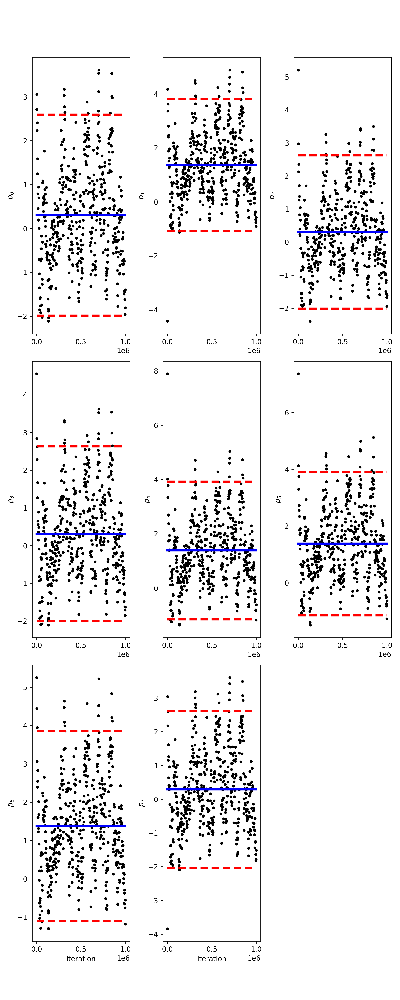

<IPython.core.display.Javascript object>


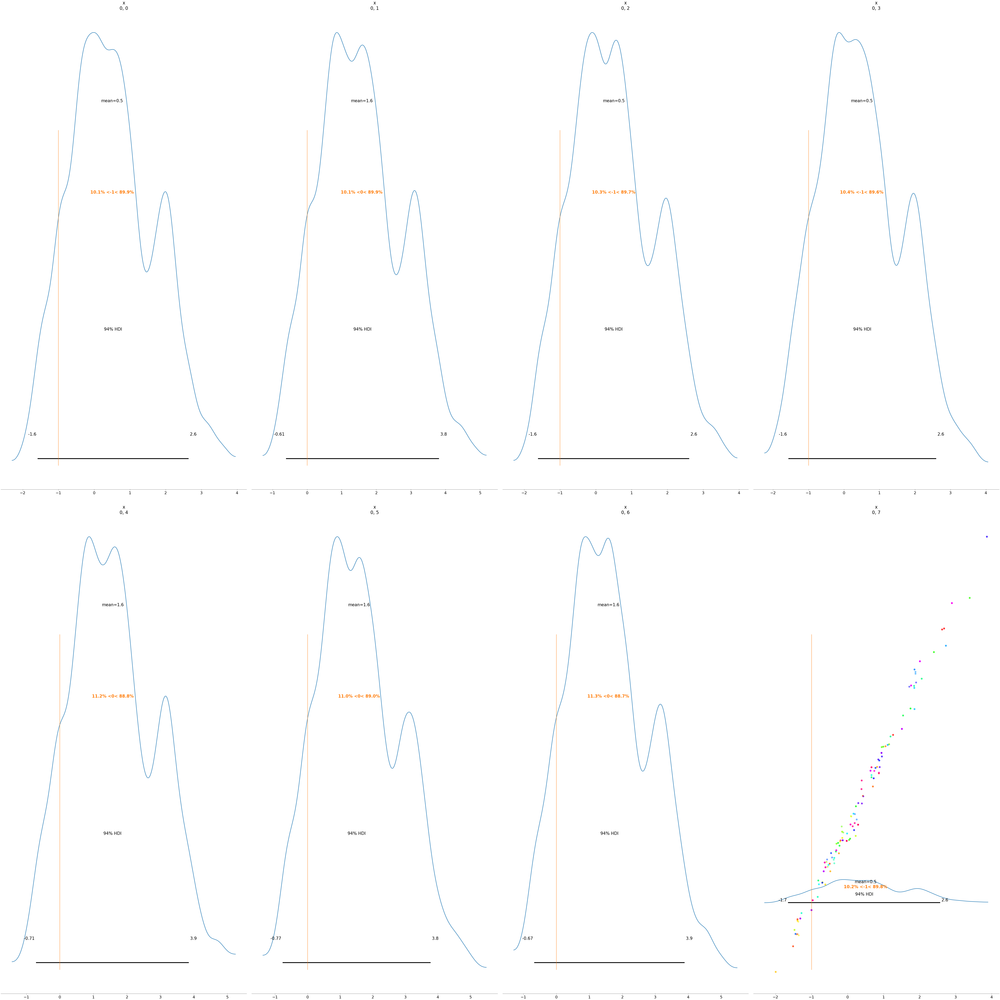

In [49]:
#Random Walk
import numpy as np
from scipy import stats
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import matplotlib.pyplot as plt


gamma = 0.95
sigma = 10
epsilon = 0.1
iters = 1000000
stepsize = 0.1
X = np.array([[1,-gamma,0,0,0,0,0,0],[0,1,0,0,0,-gamma,0,0],[0,-gamma,1,0,0,0,0,0],[0,-gamma,0,1,0,0,0,0],[0,0,0,0,1,-gamma,0,0],[0,0,0,0,0,1,-gamma,0],[0,0,0,0,0,-gamma,1,0],[0,-gamma,0,0,0,0,0,1]])
r = np.array([-1,0,-1,-1,0,0,0,-1])

chain = np.zeros((iters+1, 8))
chain_original = np.zeros((iters+1, 8))

xc = stats.norm.rvs(loc=0, scale=sigma, size=8)
#xc = np.array([-1,0,-1,-1,0,0,0,-1])
xc_lp = stats.norm.logpdf(xc, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xc, gamma=gamma), scale=epsilon).sum()
chain[0] = xc
chain_original[0] = xc

acc = 0

for i in tqdm(range(iters)):
    xp = xc + stepsize * stats.norm.rvs(loc=0, scale=1, size=8)
    xp_lp = stats.norm.logpdf(xp, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xp, gamma=gamma), scale=epsilon).sum()
    chain_original[i+1] = xp
    if np.log(np.random.uniform()) < (xp_lp - xc_lp):
        xc = xp
        xc_lp = xp_lp
        acc += 1
    chain[i+1] = xc
    
chain = np.array(chain)
chain_original = np.array(chain_original)

acc /= (iters+1)
print("ACC", acc)
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 8)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[-1,0,-1,-1,0,0,0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [00:55<00:00, 1804.97it/s]


ACC 0.0
ESS 8.000640051204096
[  7.32739364   3.54230603 -18.61826572   1.31044516   2.70051577
   1.71110307   0.81232003 -15.06543551]


<IPython.core.display.Javascript object>


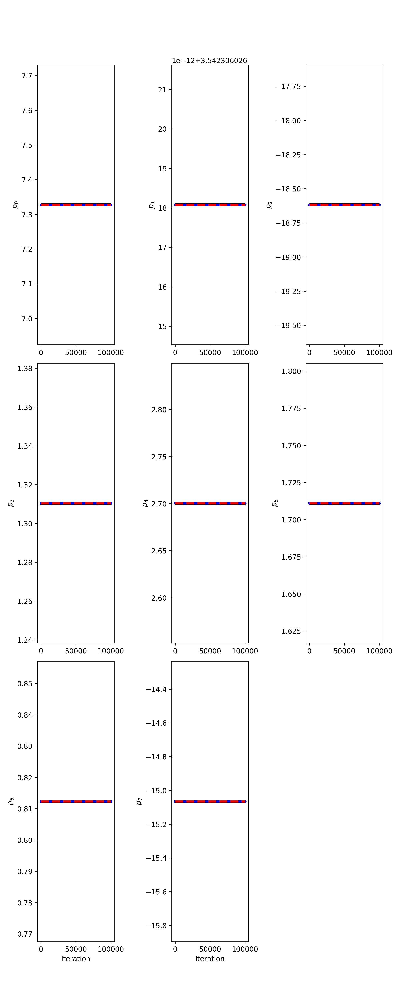

<IPython.core.display.Javascript object>


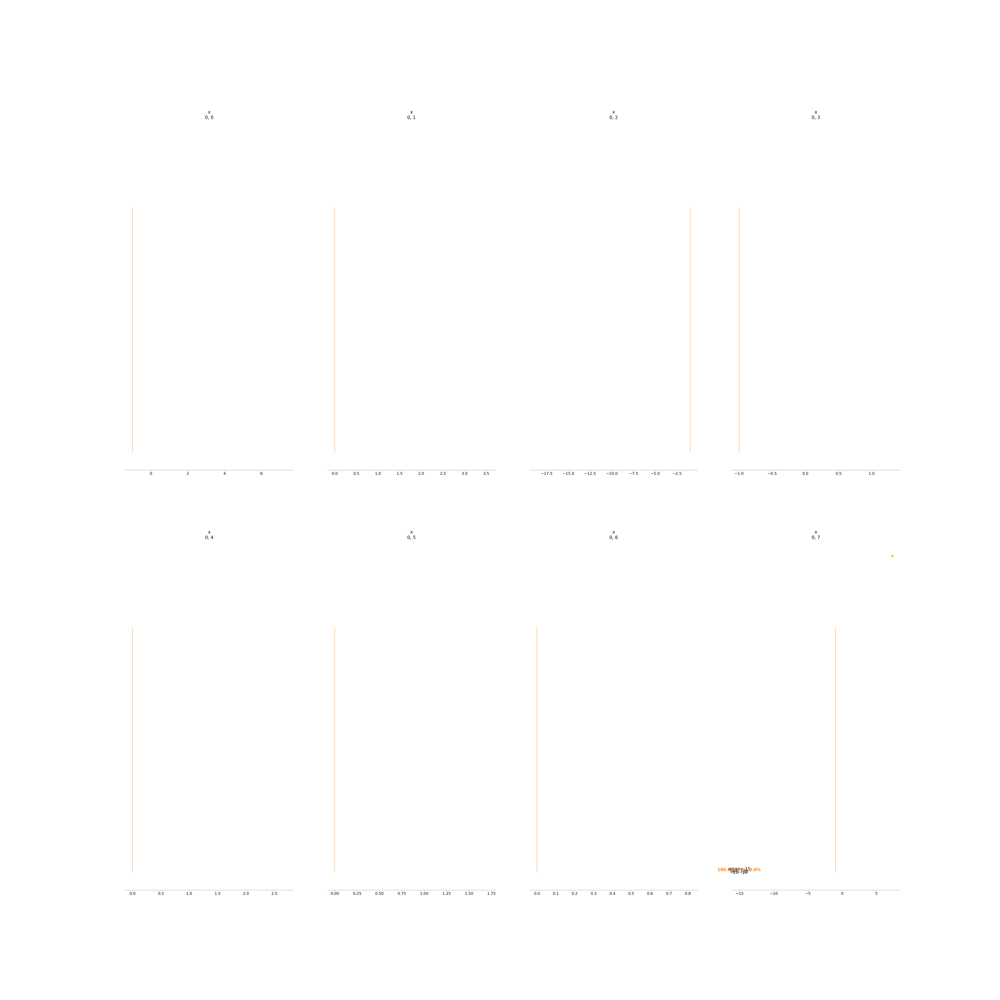

C:\Users\cwh38\AppData\Local\miniconda3\lib\site-packages\arviz\stats\density_utils.py:620: RuntimeWarning: invalid value encountered in double_scalars
  x_std = (((x ** 2).sum() / x_len) - (x.sum() / x_len) ** 2) ** 0.5
C:\Users\cwh38\AppData\Local\miniconda3\lib\site-packages\arviz\stats\density_utils.py:770: UserWarning: Something failed when estimating the bandwidth. Please check your data
  warnings.warn("Something failed when estimating the bandwidth. Please check your data")
C:\Users\cwh38\AppData\Local\miniconda3\lib\site-packages\arviz\stats\density_utils.py:783: RuntimeWarning: divide by zero encountered in true_divide
  pdf /= bw * (2 * np.pi) ** 0.5
C:\Users\cwh38\AppData\Local\miniconda3\lib\site-packages\arviz\stats\density_utils.py:783: RuntimeWarning: invalid value encountered in true_divide
  pdf /= bw * (2 * np.pi) ** 0.5


In [20]:
#MALA
import numpy as np
from scipy import stats
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import matplotlib.pyplot as plt


gamma = 0.95
sigma = 10
epsilon = 0.1
iters = 100000
stepsize = 0.1
X = np.array([[1,-gamma,0,0,0,0,0,0],[0,1,0,0,0,-gamma,0,0],[0,-gamma,1,0,0,0,0,0],[0,-gamma,0,1,0,0,0,0],[0,0,0,0,1,-gamma,0,0],[0,0,0,0,0,1,-gamma,0],[0,0,0,0,0,-gamma,1,0],[0,-gamma,0,0,0,0,0,1]])
r = np.array([-1,0,-1,-1,0,0,0,-1])

chain = np.zeros((iters+1, 8))

xc = stats.norm.rvs(loc=0, scale=sigma, size=8)
xc_lp = stats.norm.logpdf(xc, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xc, gamma=gamma), scale=epsilon).sum()
xc_grad = gradient(x=xc, r=r, sigma=sigma, epsilon=epsilon, gamma=gamma)
chain[0] = xc
acc = 0

for i in tqdm(range(iters)):

    xp = xc + (stepsize **2) * xc_grad + (2*stepsize) * stats.norm.rvs(loc=0, scale=1, size=8)
    xp_lp = stats.norm.logpdf(xp, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xp, gamma=gamma), scale=epsilon).sum()
    xp_grad = gradient(x=xp, r=r, sigma=sigma, epsilon=epsilon, gamma=gamma)
    move_ratio = stats.norm.logpdf(xp, loc=xc + (stepsize **2) * xc_grad, scale=2*stepsize).sum() - stats.norm.logpdf(xc, loc=xp + (stepsize **2) * xp_grad, scale=2*stepsize).sum() #new - old

    if np.log(np.random.uniform()) < (xp_lp - xc_lp - move_ratio):
        xc = xp
        xc_lp = xp_lp
        xc_grad = xp_grad
        acc += 1
    chain[i+1] = xc

chain = np.array(chain)
acc /= (iters+1)
print("ACC", acc)
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 8)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[-1,0,-1,-1,0,0,0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import cm

burnin = 10000

cdict = {'red':  ((0.0, 1.0, 1.0),
                   (1.0, 0.0, 0.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 0.0),
                   (1.0, 1.0, 1.0))}
cmap = LinearSegmentedColormap('RedBlue', cdict)
cmap = cm.get_cmap('hsv')

index1 = 0
index2 = 1
# plot the line with colors changing from red to blue by its order
plt.plot(chain[burnin:,index1], chain[burnin:,index2], color=cmap(0), linewidth=2.0)
for i in range(1, len(chain[burnin:,index1])):
    plt.plot([chain[burnin:,index1][i-1], chain[burnin:,index1][i]], [chain[burnin:,index2][i-1], chain[burnin:,index2][i]], color=cmap(i/len(chain[burnin:,index1])), linewidth=2.0)

    
#plt.plot(chain[:,0],chain[:,1])


KeyboardInterrupt



In [116]:
from matplotlib.animation import FuncAnimation


In [117]:
chain.shape

(1000001, 8)

<IPython.core.display.Javascript object>


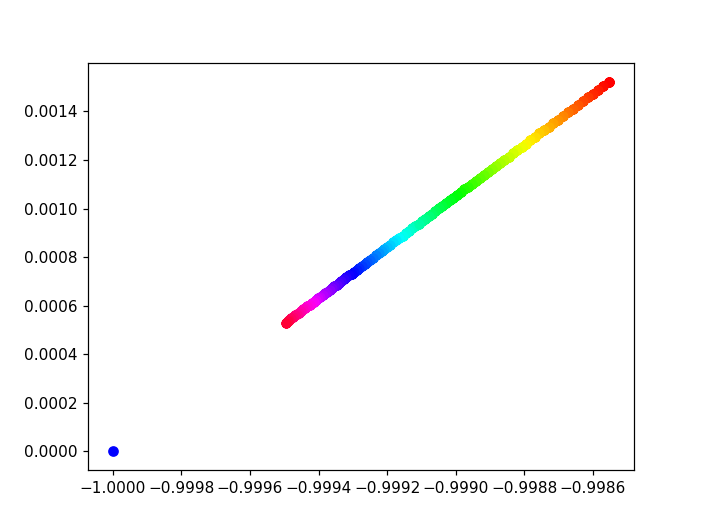

In [124]:
from matplotlib.animation import FuncAnimation
chainplot = chain
%matplotlib notebook
fig = plt.figure()
burnin = 1000
plt.scatter([-1],[0], color="b")
skip = 1000
label = plt.text(-1, 3, '', ha='center', va='center', fontsize=10, color="Red")
s0 = stats.norm.logpdf(chainplot[burnin], loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(chainplot[burnin], gamma=gamma), scale=epsilon).sum()
def updatefig(i):
    global s0
    i *= skip
    s = stats.norm.logpdf(chainplot[burnin+i], loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(chainplot[burnin+i], gamma=gamma), scale=epsilon).sum()
    plt.scatter([chainplot[burnin:,index1][i], chainplot[burnin:,index1][i+1]], [chainplot[burnin:,index2][i], chainplot[burnin:,index2][i+1]], color=cmap(i/len(chainplot[burnin:,index1])), linewidth=.5, alpha=0.5)
    label.set_text(np.round(s-s0,3))
    s0=s
    
ani = FuncAnimation(fig, updatefig, interval=0.1, blit=True, frames=len(chainplot[burnin:,index1])//skip-1)
plt.show()

In [22]:
from scipy import stats
ll_list = []
for i in range(len(chain)):
    sample = chain[i]
    ll_list.append(stats.norm.logpdf(sample, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(sample, gamma=gamma), scale=epsilon).sum())

In [23]:
np.max(ll_list)
chain[np.argmax(ll_list)]

array([-0.5658437 ,  0.44836807, -0.60162044, -0.5725082 ,  0.4418761 ,
        0.4363501 ,  0.46141434, -0.5552161 ], dtype=float32)

In [24]:
np.max(ll_list)

-88.47742785581846

In [137]:
epsilon = 0.1

In [138]:
sigma = 100000

In [197]:
gamma = 0.25
stats.norm.logpdf(chain.mean(axis=0), loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(chain.mean(axis=0), gamma=gamma), scale=epsilon).sum()
test = np.array([-1.,0.,-1.,-1.,0.,-0.,-0.,-1.]) + 5
stats.norm.logpdf(test, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(test, gamma=gamma), scale=epsilon).sum()

-5694.965059583133

In [136]:
import numpy as np
from scipy.stats import kde
 
# create data
 
# Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
nbins=300
k = kde.gaussian_kde([chain[:,0],chain[:,1]])
xi, yi = np.mgrid[chain[:,0].min():chain[:,0].max():nbins*1j, chain[:,1].min():chain[:1].max():nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
 
# Make the plot
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
plt.show()
 
# Change color palette
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.Greens_r)
plt.show()

C:\Users\cwh38\AppData\Local\Temp\ipykernel_20828\1065157646.py:8: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([chain[:,0],chain[:,1]])

KeyboardInterrupt



In [125]:
import pyro
import pyro.distributions as dist
import torch
import matplotlib.pyplot as plt

gamma = 0.95
sigma = 100000
epsilon = 0.001
iters = 10000
stepsize = 0.03
r = torch.tensor([-1.,0.,-1.,-1.,0.,0.,0.,-1.])

def rhat_torch(x, gamma=0.95):
    rhat = torch.zeros_like(x)
    rhat[0] = x[0] - gamma * torch.max(x[0:4])
    rhat[1] = x[1] - gamma * torch.max(x[4:])
    rhat[2] = x[2] - gamma * torch.max(x[0:4])
    rhat[3] = x[3] - gamma * torch.max(x[0:4])
    rhat[4] = x[4] - gamma * torch.max(x[4:])
    rhat[5] = x[5] - gamma * torch.max(x[4:])
    rhat[6] = x[6] - gamma * torch.max(x[4:])
    rhat[7] = x[7] - gamma * torch.max(x[0:4])
    return rhat

def model(data):
    prior_parameter = pyro.sample("prior_parameter", dist.MultivariateNormal(torch.zeros(8), (sigma **2) * torch.eye(8)))
    mean = rhat_torch(prior_parameter, gamma=gamma)
    with pyro.plate("data_plate"):
        pyro.sample("obs", dist.MultivariateNormal(mean, epsilon ** 2 * torch.eye(8)), obs=data)

def mcmc(data, num_samples=iters, warmup_steps=iters//10):
    pyro.clear_param_store()

    kernel = pyro.infer.mcmc.NUTS(model, adapt_step_size=True, adapt_mass_matrix=True, full_mass=True)
    mcmc_run = pyro.infer.mcmc.MCMC(kernel, num_samples=num_samples, warmup_steps=warmup_steps, initial_params={'prior_parameter': r})
    mcmc_run.run(data)

    return mcmc_run

def plot_samples(samples):
    plt.hist(samples, bins=50, density=True)
    plt.xlabel("mean")
    plt.ylabel("density")
    plt.show()

# run MCMC
mcmc_run = mcmc(r)

# get samples
posterior_samples = mcmc_run.get_samples()["prior_parameter"]

# plot samples
#plot_samples(posterior_samples)

Sample: 100%|██████████████████████████████████████| 11000/11000 [06:18, 29.09it/s, step size=1.15e-01, acc. prob=0.861]                                                                    


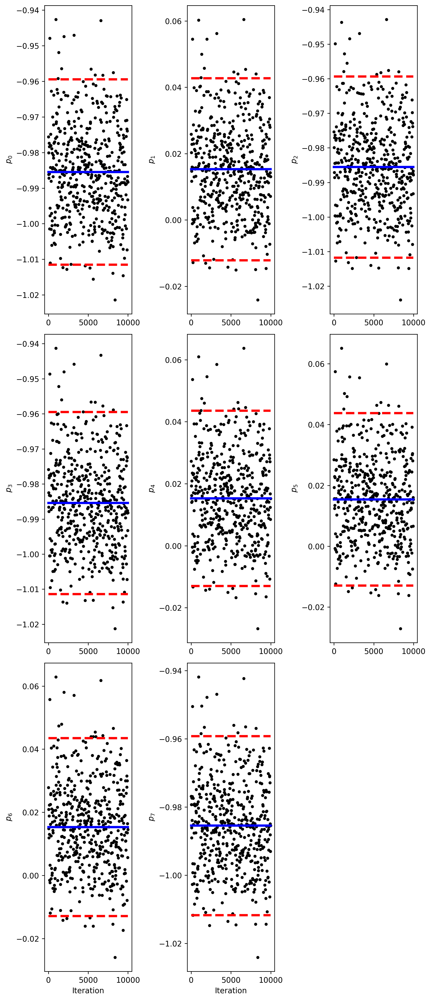

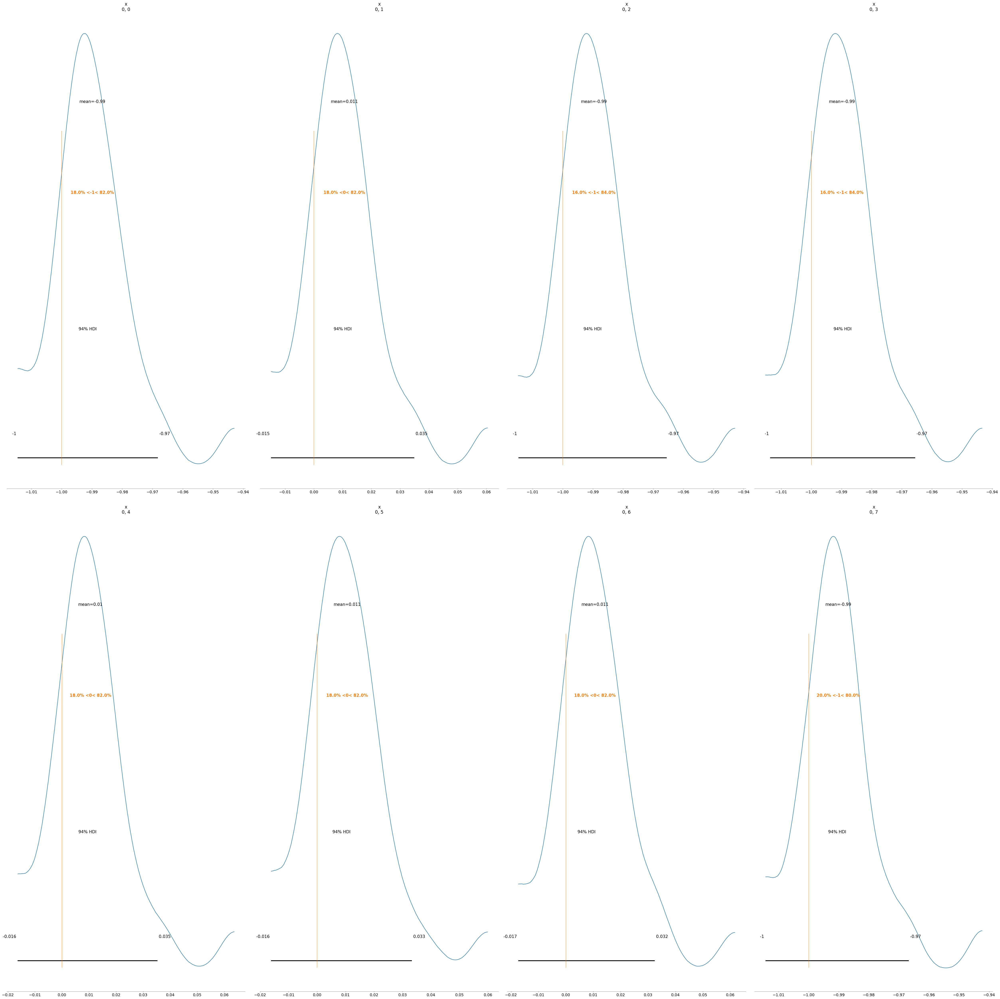

In [128]:
%matplotlib inline
import arviz as az
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import numpy as np

chain = posterior_samples.numpy()

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))


paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 8)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=(np.array([-1,0,-1,-1,0,0,0,-1])).tolist(), figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

In [11]:
sigma

100000

In [95]:
#Chatgpt implemented MCMC
import numpy as np

def log_prior(x, sigma):
    """
    Computes the log-prior density of x, assuming a multivariate Gaussian prior with mean 0
    and variance sigma^2 independently for each dimension.
    """
    return -0.5 * np.sum(x**2) / sigma**2 - 0.5 * len(x) * np.log(2*np.pi*sigma**2)

def log_likelihood(x, r, epsilon, gamma):
    """
    Computes the log-likelihood density of x given the observed data, assuming a Gaussian
    likelihood with mean x and variance sigma^2.
    """
    return stats.norm.logpdf(r, loc=rhat(x, gamma=gamma), scale=epsilon).sum()

def log_posterior(x, r, sigma, gamma, epsilon):
    """
    Computes the log-posterior density of x, assuming a multivariate Gaussian prior and a
    Gaussian likelihood with mean x and variance sigma^2.
    """
    return log_prior(x, sigma) + log_likelihood(x, r, epsilon, gamma)

def mcmc_random_walk(r, sigma, stepsize, initial_state=np.random.normal(size=8), num_iterations=1000):
    """
    Runs an MCMC simulation using a random walk Metropolis-Hastings algorithm to sample
    from the posterior distribution of an n-dimensional vector with a multivariate
    Gaussian prior and a Gaussian likelihood with mean x and variance sigma^2.
    """
    acc = 0
    n = len(initial_state)
    samples = [initial_state]
    log_prob = log_posterior(initial_state, r, sigma, gamma, epsilon)
    for i in range(num_iterations):
        proposal = samples[-1] + np.random.normal(scale=stepsize, size=n)
        log_prob_proposal = log_posterior(proposal, r, sigma, gamma, epsilon)
        if log_prob_proposal > log_prob or np.random.rand() < np.exp(log_prob_proposal - log_prob):
            samples.append(proposal)
            log_prob = log_prob_proposal
            acc += 1
        else:
            samples.append(samples[-1])
    print("acc", acc/num_iterations)
    return np.array(samples)

chatgpt_chain = mcmc_random_walk(r, sigma, stepsize, num_iterations=100000)

acc 0.14414


In [96]:
chatgpt_chain.mean(0)

array([-0.02995226,  1.0256682 , -0.02683155, -0.0264756 ,  1.01290047,
        1.01035696,  1.01264111, -0.02665695])


 21%|████████████████████████████▋                                                                                                              | 206308/1000000 [00:08<00:32, 24720.57it/s]


 40%|████████████████████████████████████████████████████████                                                                                   | 403141/1000000 [00:17<00:24, 24761.15it/s]


 60%|████████████████████████████████████████████████████████████████████████████████████                                                       | 604986/1000000 [00:25<00:16, 23582.18it/s]


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 813241/1000000 [00:34<00:07, 24478.32it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000000/1000000 [00:41<00:00, 24001.43it/s]


ACC 0.0
ESS 11.396942013775313
[-0.98024399  0.02078835 -0.98024399 -0.98024399  0.0218463   0.02076143
  0.02076143 -0.98024399]


<IPython.core.display.Javascript object>


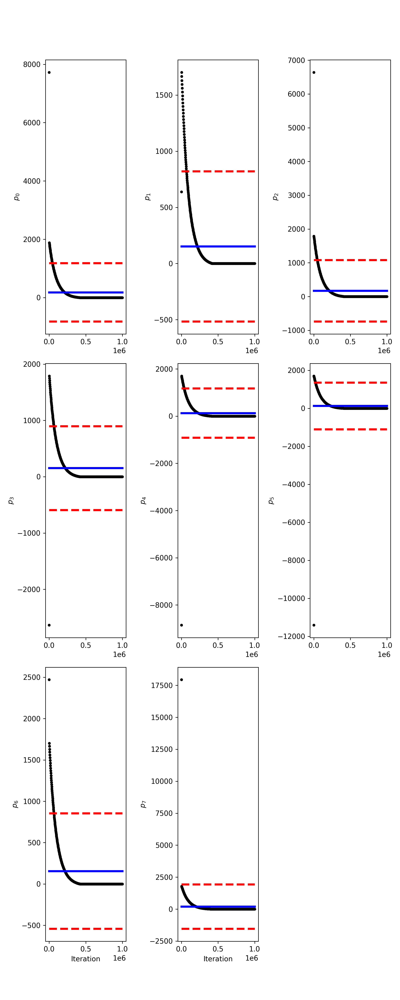

<IPython.core.display.Javascript object>


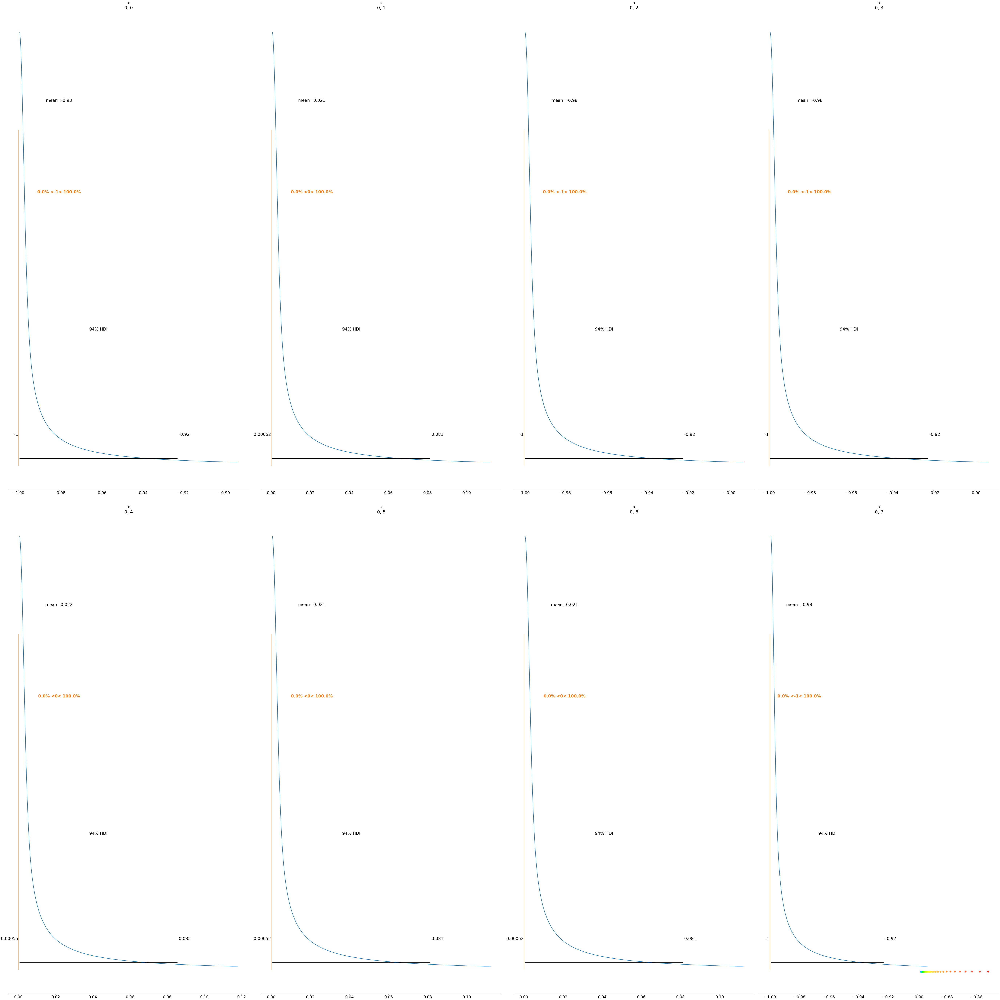

In [122]:
#Gradient Descent
import numpy as np
from scipy import stats
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import matplotlib.pyplot as plt


gamma = 0.95
sigma = 10000
epsilon = 0.1
iters = 1000000
stepsize = 0.0003
X = np.array([[1,-gamma,0,0,0,0,0,0],[0,1,0,0,0,-gamma,0,0],[0,-gamma,1,0,0,0,0,0],[0,-gamma,0,1,0,0,0,0],[0,0,0,0,1,-gamma,0,0],[0,0,0,0,0,1,-gamma,0],[0,0,0,0,0,-gamma,1,0],[0,-gamma,0,0,0,0,0,1]])
r = np.array([-1,0,-1,-1,0,0,0,-1])

chain = np.zeros((iters+1, 8))

xc = stats.norm.rvs(loc=0, scale=sigma, size=8)
xc_lp = stats.norm.logpdf(xc, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xc, gamma=gamma), scale=epsilon).sum()
xc_grad = gradient(x=xc, r=r, sigma=sigma, epsilon=epsilon, gamma=gamma)
chain[0] = xc
acc = 0

for i in tqdm(range(iters)):

    xc = xc + stepsize * xc_grad
    xc_grad = gradient(x=xc, r=r, sigma=sigma, epsilon=epsilon, gamma=gamma)
    chain[i+1] = xc

chain = np.array(chain)
acc /= (iters+1)
print("ACC", acc)
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 8)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[-1,0,-1,-1,0,0,0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

In [27]:
sigma

100000

In [113]:
#Optimised function
optim_fun = lambda x: - stats.norm.logpdf(x, loc=0, scale=sigma).sum() - stats.norm.logpdf(r, loc=rhat(x, gamma=gamma), scale=0.1).sum()
from scipy.optimize import minimize
res = minimize(optim_fun, [0,0,0,0,0,0,0,0], method="Powell")

In [32]:
res

   direc: array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  1.        ],
       [ 0.        ,  1.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  1.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ],
       [-0.28846554,  0.07249327,  0.18385953,  0.18385953,  0.0499994 ,
         0.04749945,  0.04749945,  0.21502796],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         1.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  1.        ,  0.        ],
       [-0.00893166, -0.00373118, -0.00276792, -0.00276792,  0.01544278,
         0.01467064,  0.01467064, -0.01480355]])
     fun: 88.38840251

In [77]:
def rhat_dim2(x, gamma):
    rhat = np.zeros_like(x)
    rhat[0] = x[0] - gamma * np.max(x,axis=0)
    rhat[1] = x[1] - gamma * np.max(x, axis=0)
    return rhat

In [183]:
%matplotlib inline

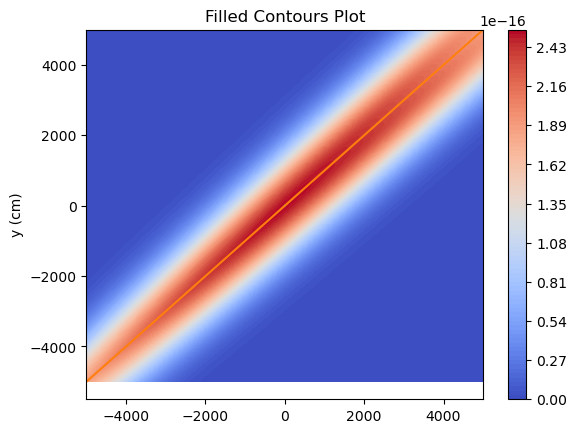

In [224]:
#2D problem
gamma = 0.95
sigma = 10000
epsilon = 1000
rreal = np.array([0,-1]).reshape((2,1,1))
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
xlist = np.linspace(-5000.0, 5000.0, 1000)
ylist = np.linspace(-5000, 5000, 1000)
X, Y = np.meshgrid(xlist, ylist)
Z = np.exp(stats.norm.logpdf(np.stack([X,Y]), loc=0, scale=sigma).sum(axis=0) + stats.norm.logpdf(rreal, loc=rhat_dim2(np.stack([X,Y]), gamma=gamma), scale=epsilon).sum(axis=0))
clev = np.arange(Z.min(),Z.max()+10,10)
fig,ax=plt.subplots(1,1)
cp = ax.contourf(X, Y, Z, cmap=plt.cm.coolwarm,levels=100)
ax.plot(rreal.flatten())
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('Filled Contours Plot')
#ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
tvec = np.linspace(-5000,5000,1000)
plt.plot(tvec+rreal.flatten()[0], tvec+rreal.flatten()[1])
plt.show()

In [216]:
gamma = 0.25
test = np.array([0,-1]) - 5000
stats.norm.logpdf(test, loc=0, scale=sigma).sum() + stats.norm.logpdf(np.array([0,-1]), loc=rhat_dim2(test, gamma=gamma), scale=epsilon).sum()

-50.224495439735335

In [ ]:
plt.figure()
top = 5
bottom = -5
numpoints = 10000
plt.plot(np.linspace(bottom,top,numpoints),Z.sum(axis=0)*(top-bottom)/numpoints)

In [ ]:
axisnum = 1
(((Z.sum(axis=axisnum)*(top-bottom)/numpoints)*np.linspace(bottom,top,numpoints)).sum()*(top-bottom)/numpoints)/(((Z.sum(axis=axisnum)*(top-bottom)/numpoints)).sum()*(top-bottom)/numpoints)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [00:35<00:00, 2841.60it/s]


ACC 0.08790912090879091
ESS 262.5327813497557
[-0.05713277 -1.0534042 ]


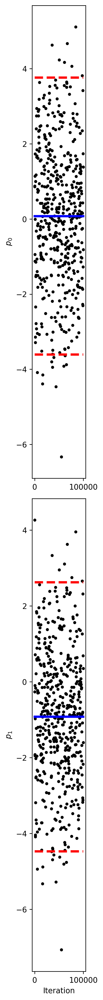

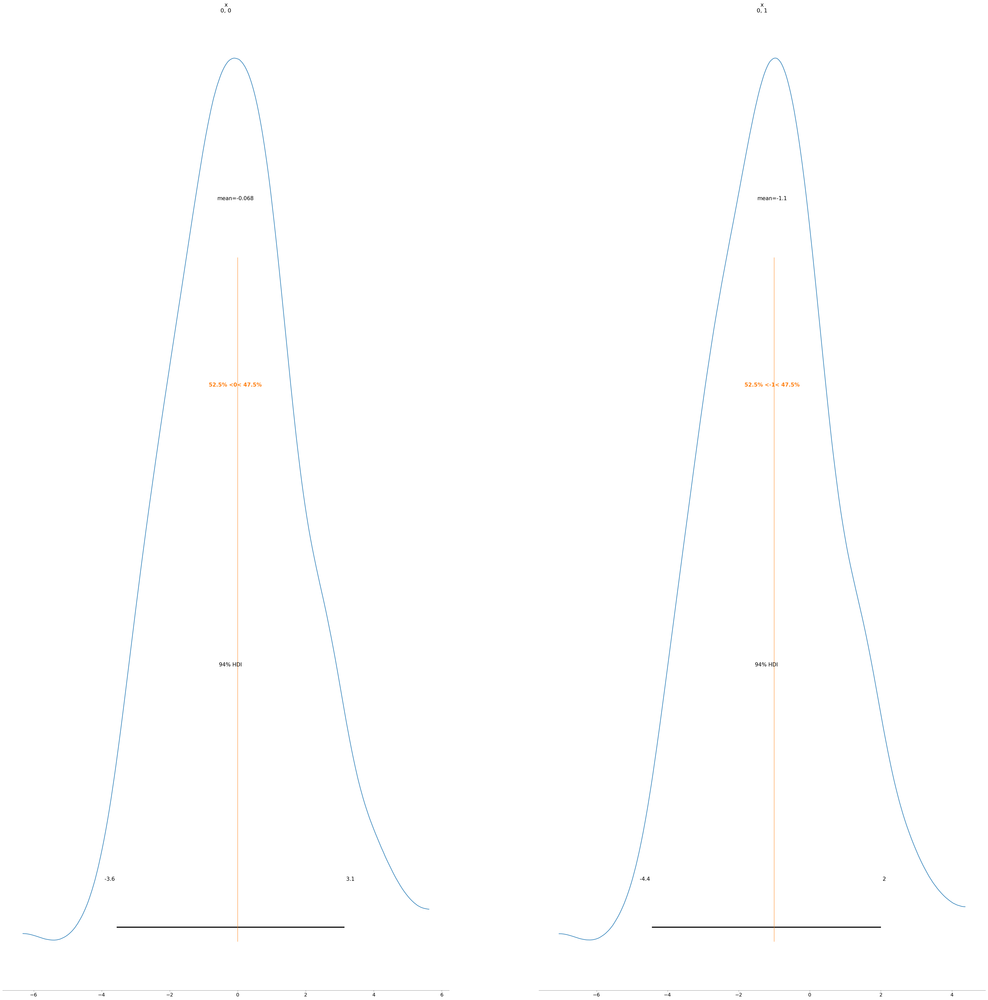

In [81]:
#2D MCMC random walk
import numpy as np
from scipy import stats
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import matplotlib.pyplot as plt


gamma = 0.95
sigma = 10
epsilon = 0.1
iters = 100000
stepsize = 1
r = np.array([0,-1])

chain = np.zeros((iters+1, 2))

xc = stats.norm.rvs(loc=0, scale=sigma, size=2)
#xc = np.array([-1,0,-1,-1,0,0,0,-1])
xc_lp = stats.norm.logpdf(xc, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat_dim2(xc, gamma=gamma), scale=epsilon).sum()
chain[0] = xc
acc = 0

for i in tqdm(range(iters)):
    xp = xc + stepsize * stats.norm.rvs(loc=0, scale=1, size=2)
    xp_lp = stats.norm.logpdf(xp, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat_dim2(xp, gamma=gamma), scale=epsilon).sum()
    if np.log(np.random.uniform()) < (xp_lp - xc_lp):
        xc = xp
        xc_lp = xp_lp
        acc += 1
    chain[i+1] = xc
    
chain = np.array(chain)
acc /= (iters+1)
print("ACC", acc)
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 2)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

In [101]:
import pyro
import pyro.distributions as dist
import torch
import matplotlib.pyplot as plt

gamma = 0.95
sigma = 100000
epsilon = 0.1
iters = 100000
stepsize = 0.03
r = torch.tensor([0.,-1.])

def rhat_torch_dim2(x, gamma=0.95):
    rhat = torch.zeros_like(x)
    rhat[0] = x[0] - gamma * torch.max(x)
    rhat[1] = x[1] - gamma * torch.max(x)
    return rhat

def model(data):
    prior_parameter = pyro.sample("prior_parameter", dist.MultivariateNormal(torch.zeros(2), (sigma **2) * torch.eye(2)))
    mean = rhat_torch_dim2(prior_parameter, gamma=gamma)
    with pyro.plate("data_plate"):
        pyro.sample("obs", dist.MultivariateNormal(mean, epsilon ** 2 * torch.eye(2)), obs=data)

def mcmc(data, num_samples=iters, warmup_steps=iters//10):
    pyro.clear_param_store()

    kernel = pyro.infer.mcmc.NUTS(model, adapt_step_size=True, adapt_mass_matrix=True, full_mass=True)
    mcmc_run = pyro.infer.mcmc.MCMC(kernel, num_samples=num_samples, warmup_steps=warmup_steps, initial_params={'prior_parameter': r})
    mcmc_run.run(data)

    return mcmc_run

def plot_samples(samples):
    plt.hist(samples, bins=50, density=True)
    plt.xlabel("mean")
    plt.ylabel("density")
    plt.show()

# run MCMC
mcmc_run = mcmc(r)

# get samples
posterior_samples = mcmc_run.get_samples()["prior_parameter"]

# plot samples
#plot_samples(posterior_samples)

Sample: 100%|███████████████████████████████████| 110000/110000 [12:35, 145.55it/s, step size=8.23e-01, acc. prob=0.927]


In [105]:
chain

array([-998.4531   ,    1.6257894, -998.4566   , -998.4555   ,
          1.6249998,    1.6240948,    1.6256863, -998.4571   ],
      dtype=float32)

ESS 27.436162828686264
[-0.01612283 -1.0149734 ]


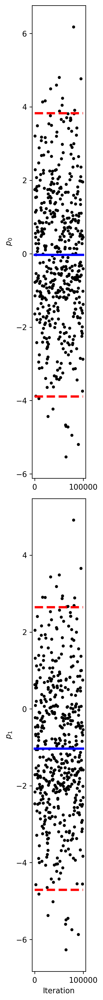

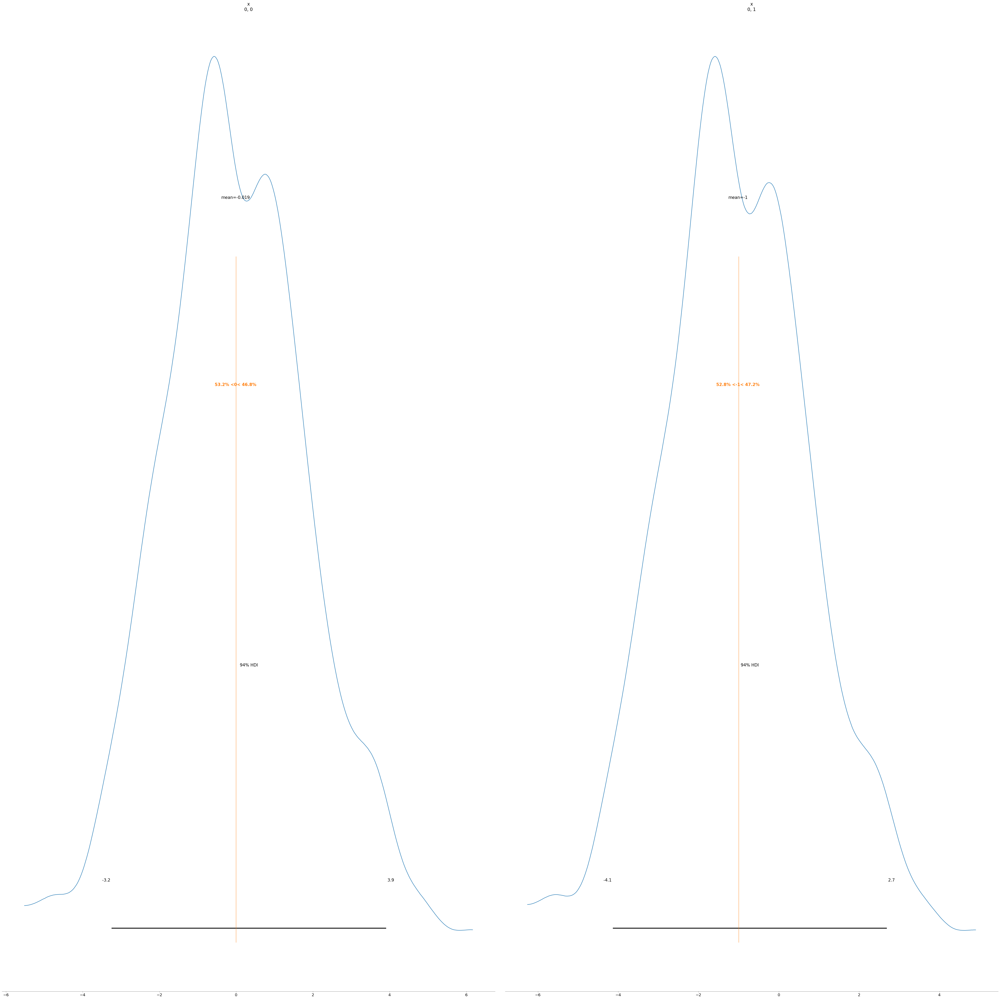

In [106]:
chain = posterior_samples.numpy()
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 2)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')


 22%|███████████████████████████████▌                                                                                                              | 22234/100000 [00:08<00:28, 2686.25it/s]


 45%|████████████████████████████████████████████████████████████████▎                                                                             | 45273/100000 [00:17<00:20, 2695.03it/s]


 68%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 68146/100000 [00:25<00:11, 2726.61it/s]


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 91190/100000 [00:34<00:03, 2726.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [00:37<00:00, 2674.03it/s]


ACC 0.0033699663003369964
ESS 124.84804367812545
[1.14775148 2.27269947 1.14540021 1.09424218 2.28294553 2.40265609
 2.33570057 1.20669235]


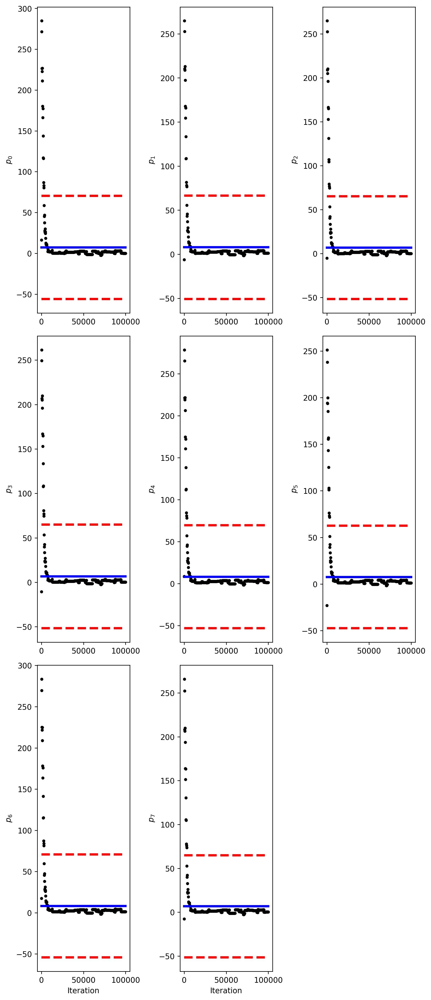

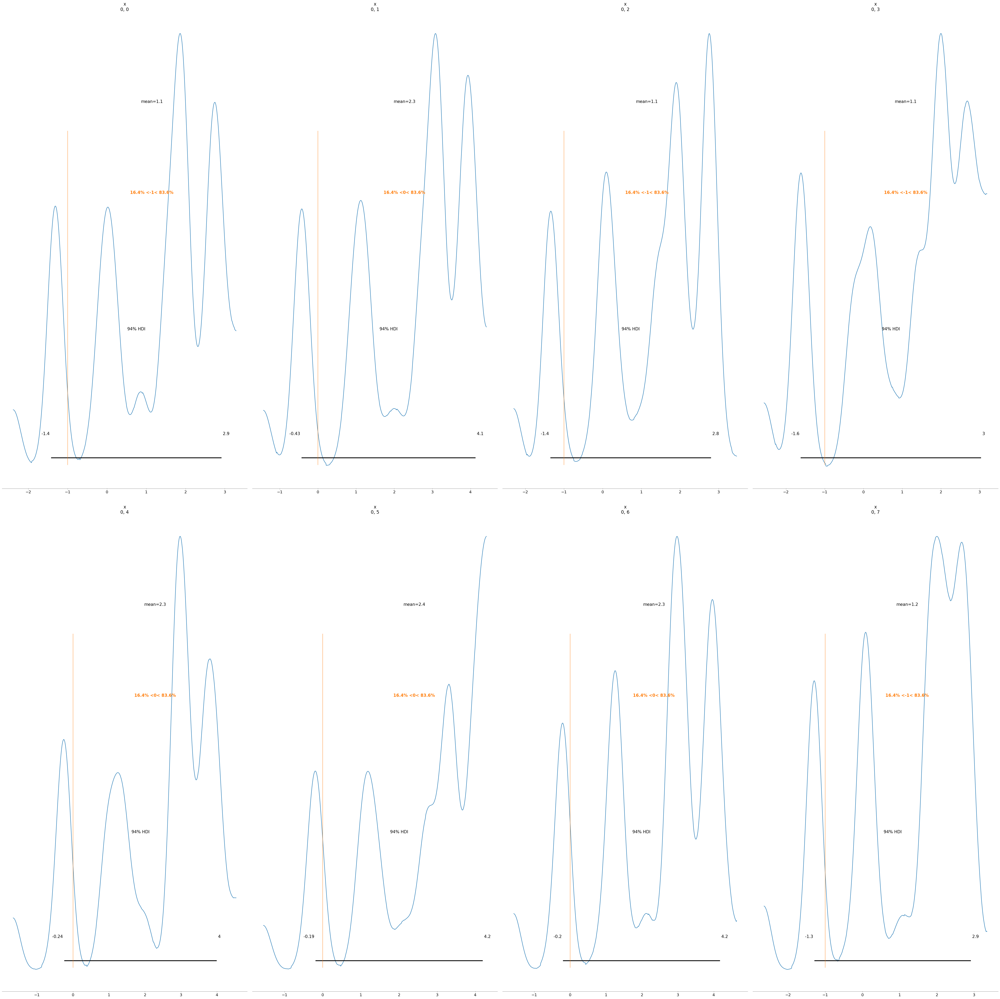

In [107]:
#Adaptive kernel
import numpy as np
from scipy import stats
from arviz import ess, plot_autocorr, plot_trace
from tqdm import tqdm
import mcmcplot.mcmcplot as mcp
import matplotlib.pyplot as plt

np.random.seed(1)
gamma = 0.95
sigma = 10
epsilon = 0.1
iters = 100000
stepsize = 0.07
X = np.array([[1,-gamma,0,0,0,0,0,0],[0,1,0,0,0,-gamma,0,0],[0,-gamma,1,0,0,0,0,0],[0,-gamma,0,1,0,0,0,0],[0,0,0,0,1,-gamma,0,0],[0,0,0,0,0,1,-gamma,0],[0,0,0,0,0,-gamma,1,0],[0,-gamma,0,0,0,0,0,1]])
r = np.array([-1,0,-1,-1,0,0,0,-1])

def rhat(x, gamma=gamma):
    rhat = np.zeros_like(x)
    rhat[0] = x[0] - gamma * max(x[0:4])
    rhat[1] = x[1] - gamma * max(x[4:])
    rhat[2] = x[2] - gamma * max(x[0:4])
    rhat[3] = x[3] - gamma * max(x[0:4])
    rhat[4] = x[4] - gamma * max(x[4:])
    rhat[5] = x[5] - gamma * max(x[4:])
    rhat[6] = x[6] - gamma * max(x[4:])
    rhat[7] = x[7] - gamma * max(x[0:4])
    return rhat

chain = np.zeros((iters+1, 8))

xc = stats.norm.rvs(loc=0, scale=sigma, size=8)
xc_lp = stats.norm.logpdf(xc, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xc, gamma=gamma), scale=epsilon).sum()
chain[0] = xc
acc = 0

C = 0.07 ** 2 * np.eye(8)
xsum = xc
sd = (2.4) ** 2 / 8
time_C = 100

for i in tqdm(range(iters)):
    #xp = xc + stepsize * stats.norm.rvs(loc=0, scale=1, size=8)
    xp = xc + stats.multivariate_normal.rvs(cov=C)
    xp_lp = stats.norm.logpdf(xp, loc=0, scale=sigma).sum() + stats.norm.logpdf(r, loc=rhat(xp, gamma=gamma), scale=epsilon).sum()
    if np.log(np.random.uniform()) < (xp_lp - xc_lp):
        xc = xp
        xc_lp = xp_lp
        acc += 1
        
    if i > time_C:
        C = C *(i/(i+1)) + sd/(i+1) * ( xsum @ xsum.T / (i+1) - (xsum + xc) @ (xsum + xc).T / (i+2) + xc @ xc.T + stepsize * np.eye(8))

    xsum = xsum + xc
    
    chain[i+1] = xc 


chain = np.array(chain)
acc /= (iters+1)
print("ACC", acc)
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 8)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[-1,0,-1,-1,0,0,0,-1], figsize=(50, 50))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')

In [91]:
#4D
import pyro
import pyro.distributions as dist
import torch
import matplotlib.pyplot as plt

gamma = 0.95
sigma = 100000
epsilon = 0.1
iters = 10000
stepsize = 0.03
r = torch.tensor([-1.,0.,-1.,0.])*1000

def rhat_torch_dim4(x, gamma=0.95):
    rhat = torch.zeros_like(x)
    rhat[0] = x[0] - gamma * torch.max(x[:2])
    rhat[1] = x[1] - gamma * torch.max(x[2:])
    rhat[2] = x[2] - gamma * torch.max(x[:2])
    rhat[3] = x[3] - gamma * torch.max(x[2:])    
    return rhat

def model(data):
    prior_parameter = pyro.sample("prior_parameter", dist.MultivariateNormal(torch.zeros(4), (sigma **2) * torch.eye(4)))
    mean = rhat_torch_dim4(prior_parameter, gamma=gamma)
    with pyro.plate("data_plate"):
        pyro.sample("obs", dist.MultivariateNormal(mean, epsilon ** 2 * torch.eye(4)), obs=data)

def mcmc(data, num_samples=iters, warmup_steps=iters//10):
    pyro.clear_param_store()

    kernel = pyro.infer.mcmc.NUTS(model, adapt_step_size=True, adapt_mass_matrix=True, full_mass=True)
    mcmc_run = pyro.infer.mcmc.MCMC(kernel, num_samples=num_samples, warmup_steps=warmup_steps, initial_params={'prior_parameter': r})
    mcmc_run.run(data)

    return mcmc_run

def plot_samples(samples):
    plt.hist(samples, bins=50, density=True)
    plt.xlabel("mean")
    plt.ylabel("density")
    plt.show()

# run MCMC
mcmc_run = mcmc(r)

# get samples
posterior_samples = mcmc_run.get_samples()["prior_parameter"]

# plot samples
#plot_samples(posterior_samples)

Sample: 100%|██████████████████████████████████████| 11000/11000 [02:04, 88.02it/s, step size=7.42e-01, acc. prob=0.920]                                                                    


In [ ]:
%matplotlib inline
chain = posterior_samples.numpy()
print("ESS", ess(chain.T))

print(chain[iters//2:].mean(axis=0))

f = mcp.plot_chain_panel(chains=chain, settings=dict(fig=dict(figsize=(len(chain[0]), 20), dpi=250),
                                                        add_pm2std=True,
                                                        mean=dict(color='b'),
                                                        plot=dict(color='k')))

import arviz as az
paras = chain[len(chain)//2 :: 100]
pos = paras.reshape(-1, 1, 1, 4)
# plt.figure(figsize=(50, 50))
az.plot_posterior(np.swapaxes(pos, 0, 1),ref_val=[-1,0,-1,0], figsize=(10, 10))#{'ref_val':Q})
plt.show()
# plt.savefig(f'Figures/MCMC/traces_T{T}_{time}')